In [36]:
import os
import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn'
from sklearn.pipeline import Pipeline
import numpy as np
import random
from scipy import stats
import matplotlib.pyplot as plt
import matplotlib as mpl
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import GradientBoostingRegressor

from sklearn.model_selection import  RandomizedSearchCV
from sklearn.metrics import mean_squared_error
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
import joblib
from sklearn.metrics import mean_absolute_error

In [134]:
# original pipeline v0 article 
def make_training_baselinev0article(dftrain, target_column, vart0,dic_corr,num_lags):
 
    # drop t=present for forecast
    X_train = dftrain.drop(vart0, axis=1)
    y_train = dftrain[target_column]
    
    # Define the pipeline steps for Random Forest
    rf_pipeline = Pipeline([
        ('scaler', StandardScaler()),  # Standardize features
        ('rf', RandomForestRegressor(n_estimators=150, random_state=42,max_features=int(len(X_train.columns)*0.7),criterion="squared_error"))  # Random Forest model
    ])

    # Define the pipeline steps for Random Forest using only log return lag
    varlag=[]
    for i in range(1,num_lags+1): 
        if 'log return_'+str(i) in dftrain.columns:
            varlag.append('log return_'+str(i)) #=['log return_'+str(i) for i in range(1,num_lags+1)]
    X_train2=X_train[varlag]
    rf_pipeline2 = Pipeline([
        ('scaler', StandardScaler()),  # Standardize features
        ('rf', RandomForestRegressor(n_estimators=150, random_state=42,max_features=int(len(X_train2.columns)*0.7),criterion="squared_error"))  # Random Forest model
    ])

    
    # Define the pipeline steps for Gradient Boosting
    gb_pipeline = Pipeline([
        ('scaler', StandardScaler()),  # Standardize features
        ('gb', GradientBoostingRegressor(random_state=56, n_estimators=100))  # Gradient Boosting model
    ])

    # Train the pipelines
    rf_pipeline.fit(X_train, y_train)
    rf_pipeline2.fit(X_train2, y_train)
    gb_pipeline.fit(X_train, y_train)

    
    
    # Perform linear regression
    slope, intercept, r_value, p_value, std_err = stats.linregress(np.array(X_train['log return_1']), np.array(y_train))
    lin_reg_model = {
        'slope': slope,
        'intercept': intercept,
        'r_value': r_value,
        'p_value': p_value,
        'std_err': std_err
    }
    

    
    return {'RandomForest': rf_pipeline, 'GradientBoosting': gb_pipeline, 'LinearRegression': lin_reg_model,'RandomForest2': rf_pipeline2}


def rolling_mean_dataframe(df, window=2, min_periods=1):
    """
    Calculate the rolling mean for each column in the DataFrame.

    Parameters:
    df (pd.DataFrame): The input DataFrame.
    window (int): The size of the moving window. Default is 2.
    min_periods (int): Minimum number of observations in window required to have a value. Default is 1.

    Returns:
    pd.DataFrame: A new DataFrame with the rolling means.
    """
    return df.rolling(window=window, min_periods=min_periods).mean()

def makecollist(size):
    cmap = mpl.colormaps['viridis']
    
    color_list = [cmap(i / size) for i in range(size)]
    #random.shuffle(color_list)
    random.Random(4).shuffle(color_list)
    hex_colors = [mpl.colors.to_hex(color) for color in color_list]
    return hex_colors
    
def select_inputdf(combined_df,vart0):
    ##### select the lag variables and features by checking which one are the more correlated to log return:
    
    var=list(combined_df.columns)
    corr=[]
    for i in var:
        if i !='log return' and i not in vart0:
            #print(i,np.corrcoef(dfsel[i],dfsel['log return'])[0,1])
            corr.append(np.abs(np.corrcoef(combined_df[i],combined_df['log return'])[0,1]))
    
    bestvar=[]
    dic_corr={}
    for i in var:
        if i !='log return' and i not in vart0:
           
            if np.abs(np.corrcoef(combined_df[i],combined_df['log return'])[0,1])>np.quantile(corr,0.65):  # threshold to select input var
              #  print(i,np.corrcoef(dfsel[i],dfsel['log return'])[0,1])
                dic_corr[i]=np.abs(np.corrcoef(combined_df[i],combined_df['log return'])[0,1])
                bestvar.append(i)

    okin=vart0+bestvar
    return combined_df[okin],dic_corr,okin



# to adress the referee comment we also make a standard pipeline with
#1-different models, 
#2-hyperparameter calibration 
#3- and with solely log-retun lag vs features from network
def train_and_tune_models(data,vart0, target_column, test_size=0.2, random_state=42, n_iter=20, model_dir="models"):
    """
    Train or load XGBoost, LightGBM, and CatBoost models, and evaluate them.

    Parameters:
    - data: pd.DataFrame, dataset containing features and the target column.
    - target_column: str, the name of the target column.
    - test_size: float, proportion of the data for testing.
    - random_state: int, random state for reproducibility.
    - n_iter: int, number of iterations for RandomizedSearchCV.
    - model_dir: str, directory where models are saved or loaded from.

    Returns:
    - models_new: dict, dictionary of trained or loaded models keyed by model name.
    """
    
    # Ensure the model directory exists
    os.makedirs(model_dir, exist_ok=True)

    # Split dataset
    y = data[target_column]
    X = data.drop(vart0, axis=1) # remove features at time t including target
    
    

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

    # Model file paths
    model_paths = {
        "XGBoost": os.path.join(model_dir, "xgboost_model.pkl"),
        "LightGBM": os.path.join(model_dir, "lightgbm_model.pkl"),
        "CatBoost": os.path.join(model_dir, "catboost_model.pkl"),
    }

    # Initialize models and hyperparameter grids
    models = {
        "XGBoost": XGBRegressor(random_state=random_state),
        "LightGBM": LGBMRegressor(random_state=random_state),
        "CatBoost": CatBoostRegressor(random_state=random_state, verbose=0),
    }
    param_grids = {
        "XGBoost": {
            'n_estimators': [100, 200, 300,500],
            'learning_rate': [0.01, 0.05, 0.1,0.2],
            'max_depth': [3, 5, 7,9],
            'subsample': [0.8, 1],
            'colsample_bytree': [0.8, 1],
        },
        "LightGBM": {
            'n_estimators': [100, 200, 300,500],
            'learning_rate': [0.01, 0.05, 0.1,0.2],
            'max_depth': [-1, 5, 10],
            'num_leaves': [31, 50, 70],
            'subsample': [0.8, 1],
        },
        "CatBoost": {
            'iterations': [100, 200, 300,500],
            'learning_rate': [0.01, 0.05, 0.1,0.2],
            'depth': [4, 6, 8,10],
        },
    }

    # Load or train models
    models_new = {}
    for model_name, model in models.items():
        model_path = model_paths[model_name]

        if os.path.exists(model_path):
            print(f"Loading {model_name} model...")
            models_new[model_name] = joblib.load(model_path)
        else:
            print(f"Training {model_name} model...")
            search = RandomizedSearchCV(
                model, param_grids[model_name], cv=3, scoring='neg_mean_squared_error', n_iter=n_iter, random_state=random_state
            )
            search.fit(X_train, y_train)
            models_new[model_name] = search.best_estimator_
            joblib.dump(models_new[model_name], model_path)

    # Evaluate models
    print("\nModel Performance:")
    for model_name, model in models_new.items():
        y_pred = model.predict(X_test)
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        r2 = r2_score(y_test, y_pred)
        print(f"{model_name}: RMSE = {rmse:.4f}, R² = {r2:.4f}")

    return models_new




In [135]:
# we start with the long time period
start, end = '1993-01-01', '2024-01-01'
df_filtered=pd.read_csv('../data_stocks/S&Pcompanies_dic.csv')
values=df_filtered['GICS Sector'].tolist()
keys=df_filtered['Symbol'].tolist()
dic_sector=dict(map(lambda i,j : (i,j) , keys,values))

df=pd.read_csv('../data_stocks/df_stocks_'+start+'_'+end+'.csv', index_col=[0], parse_dates=[0])

Time=len(df)
Nstocks=df.columns
labstocks=list(df.columns.values)
dicstocks={}
for i in range(len(labstocks)):
    dicstocks[i]=labstocks[i]
Nstocks=len(df.columns)
print('Time=',Time,'Nstock=',Nstocks)

# for the long time period:
num_lags=5
W=3

Time= 7805 Nstock= 267


In [136]:

# preparing the training dataset
Ntrain=int(0.85*Nstocks)
random.seed(10)
ts=[i for i in range(Nstocks)]
random.shuffle(ts)
dfiall=[]



for istock in ts[:Ntrain]:
    filename = f'data_pdfnetwork_yglob/stock_{istock}_results_yr.csv'
    dfi=pd.read_csv(filename)    
    # smooth data mean average of past W values 
    dfi_smoothed=rolling_mean_dataframe(dfi,window=W)
    vart0=list(dfi_smoothed.columns)
    dfsel= dfi_smoothed.copy()
    for lag in range(1, num_lags + 1):
        for var in vart0:
                dfsel[f'{var}_{lag}'] = dfsel[var].shift(lag)
    dfsel.dropna(inplace=True)
    dfsel.reset_index(drop=True, inplace=True)
    dfiall.append(dfsel)
    
# Concatenate all dataframes in the list
combined_df = pd.concat(dfiall, ignore_index=True)
print(len(combined_df))

varlag=['log return_'+str(i) for i in range(1,num_lags+1)]
dfi_smoothed.head()


# baseline ML prediction : select input okin features network from correlations (top 30th quantile pdf) 
dftrain,dic_corr,okin=select_inputdf(combined_df,vart0)
models = make_training_baselinev0article(dftrain, 'log return', vart0,dic_corr,num_lags)

5650


In [137]:
# to adress the referee comments we also make a standard pipeline with
#1-different models, 
#2-hyperparameter calibration 
#3- and with solely log-retun lag vs features from network
print('*'*50)
target='log return'
print('read or train and tune models for network feats input')
models_new=train_and_tune_models(combined_df,vart0 ,target, test_size=0.2, random_state=42, n_iter=15, model_dir="models_net")

print('*'*50)
print('read or train and tune models for lag of log-return feats input')
# make models without network feats only lag return:
vartodrop = [col for col in combined_df.columns if not col.startswith('log return')]
vartodrop.insert(0,target)
models_new_lg_only=train_and_tune_models(combined_df,vartodrop ,target, test_size=0.2, random_state=42, n_iter=15, model_dir="models_logonly")


**************************************************
read or train and tune models for network feats input
Loading XGBoost model...
Loading LightGBM model...
Loading CatBoost model...

Model Performance:
XGBoost: RMSE = 0.0004, R² = 0.5543
LightGBM: RMSE = 0.0004, R² = 0.5544
CatBoost: RMSE = 0.0004, R² = 0.5718
**************************************************
read or train and tune models for lag of log-return feats input
Loading XGBoost model...
Loading LightGBM model...
Loading CatBoost model...

Model Performance:
XGBoost: RMSE = 0.0005, R² = 0.4208
LightGBM: RMSE = 0.0005, R² = 0.4374
CatBoost: RMSE = 0.0005, R² = 0.4491


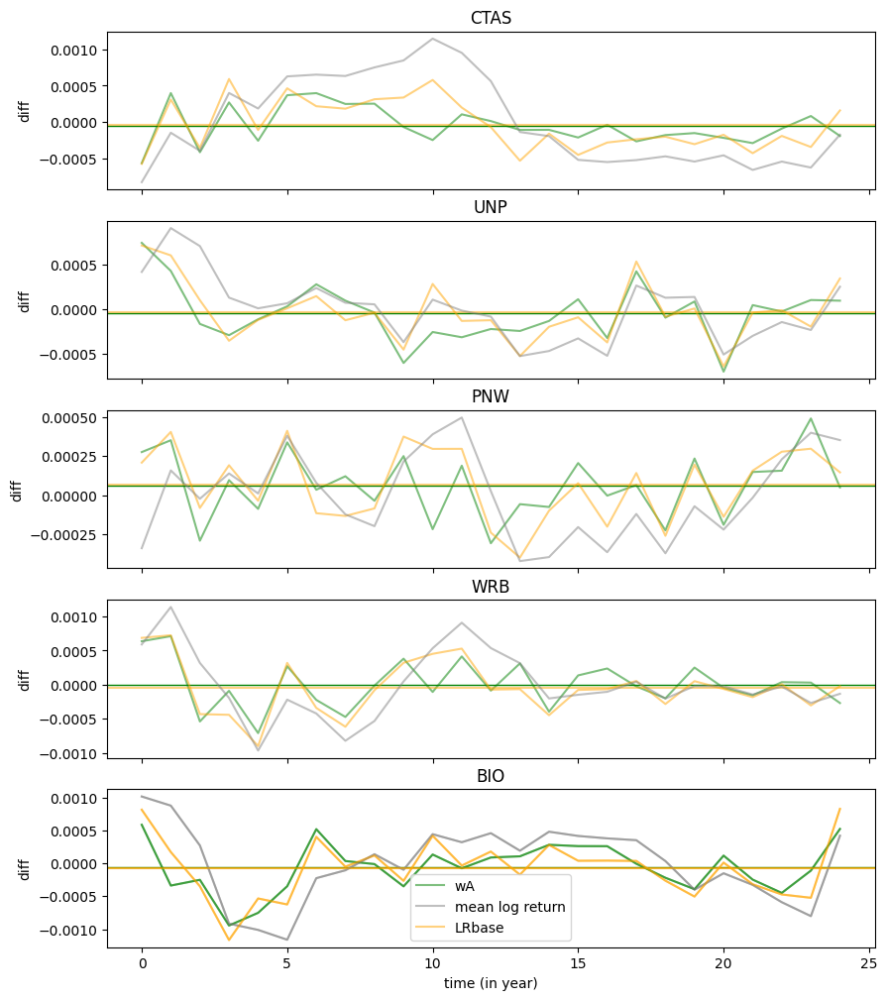

In [138]:
# we predict the models on the test set and output a plot for the pred of 5 stocks 
num_subplots = 5
fig, axes = plt.subplots(num_subplots, 1, sharex=True, figsize=(10, 12))


r2rf=[]
r2rf2=[]
r2gb=[]
r2l=[]
r2w=[]
r2m=[]
r2w_lr=[]

r2xgbbase=[]
r2lgbmbase=[]
r2catbase=[]
r2xgb=[]
r2lgbm=[]
r2cat=[]

colist=makecollist(len(ts[Ntrain:]))
ic=0

# make a prediction for each stock in the test set
for istock in ts[Ntrain:]:
    filename = f'data_pdfnetwork_yglob/stock_{istock}_results_yr.csv'
    dfi=pd.read_csv(filename)
    # smooth data mean average of past W values 
    dfi_smoothed=rolling_mean_dataframe(dfi,window=W)

    #################################################################
    # predictions with the network features: ########################
    vart0=list(dfi_smoothed.columns)
    dfsel= dfi_smoothed.copy()
    for lag in range(1, num_lags + 1):
        for var in vart0:
                dfsel[f'{var}_{lag}'] = dfsel[var].shift(lag)
    dfsel.dropna(inplace=True)
    dfsel.reset_index(drop=True, inplace=True)
    dfsel2=dfsel.copy()
    
    dfsel=dfsel[okin]
    y_true=dfsel['log return']
    X_test=dfsel.drop(vart0, axis=1)
    X_test2=dfsel2.drop(vart0, axis=1)
    
    rf_predictions = models['RandomForest'].predict(X_test)
    gb_predictions = models['GradientBoosting'].predict(X_test)
    XGBoost_predictions=models_new['XGBoost'].predict(X_test2)
    LightGBM_predictions=models_new['LightGBM'].predict(X_test2)
    CatBoost_predictions=models_new['CatBoost'].predict(X_test2)

    Ypred=rf_predictions
    mse = mean_absolute_error(y_true,Ypred)
    r2 = r2_score(y_true, Ypred)  
    r2rf.append([r2,mse])

    Ypred=gb_predictions
    mse = mean_absolute_error(y_true,Ypred)
    r2 = r2_score(y_true, Ypred)  
    r2gb.append([r2,mse])

    Ypred=XGBoost_predictions
    mse = mean_absolute_error(y_true,Ypred)
    r2 = r2_score(y_true, Ypred)  
    r2xgb.append([r2,mse])

    Ypred=LightGBM_predictions
    mse = mean_absolute_error(y_true,Ypred)
    r2 = r2_score(y_true, Ypred)  
    r2lgbm.append([r2,mse])

    Ypred=CatBoost_predictions
    mse = mean_absolute_error(y_true,Ypred)
    r2 = r2_score(y_true, Ypred)  
    r2cat.append([r2,mse])

     # Calculate the weighted average
    predictions_weights = {
    "RandomForest": {"predictions": models['RandomForest'].predict(X_test), "weight": 0.48},
    "GradientBoosting": {"predictions": models['GradientBoosting'].predict(X_test), "weight": 0.48},
    "XGBoost": {"predictions": models_new['XGBoost'].predict(X_test2), "weight": 0.55},
    "LightGBM": {"predictions": models_new['LightGBM'].predict(X_test2), "weight": 0.55},
    "CatBoost": {"predictions": models_new['CatBoost'].predict(X_test2), "weight": 0.57}}
    numerator = sum(pred["predictions"] * pred["weight"] for pred in predictions_weights.values())
    denominator = sum(pred["weight"] for pred in predictions_weights.values())
    yw = numerator / denominator

    Ypred=yw
    mse = mean_absolute_error(y_true,Ypred)
    r2 = r2_score(y_true, Ypred)  
    r2w.append([r2,mse])

    ###############################################################
    # prediction without network features #########################
    varlagsel=[]
    varlag=[]
    for i in range(1,num_lags+1): 
        varlag.append('log return_'+str(i))
        if 'log return_'+str(i) in dftrain.columns:
            varlagsel.append('log return_'+str(i))
            
    X_testlagsel=X_test[varlagsel]
    X_testlag=X_test2[varlag]
    rf_predictions2 = models['RandomForest2'].predict(X_testlagsel)
    lin_reg_predictions = models['LinearRegression']['slope'] * X_test['log return_1'] + models['LinearRegression']['intercept']
    XGBoost_predictions_lgonly=models_new_lg_only['XGBoost'].predict(X_testlag)
    LightGBM_predictions_lgonly=models_new_lg_only['LightGBM'].predict(X_testlag)
    CatBoost_predictions_lgonly=models_new_lg_only['CatBoost'].predict(X_testlag)
    
    Ypred=rf_predictions2
    mse = mean_absolute_error(y_true,Ypred)
    r2 = r2_score(y_true, Ypred)  
    r2rf2.append([r2,mse])

    Ypred=lin_reg_predictions
    mse = mean_absolute_error(y_true,Ypred)
    r2 = r2_score(y_true, Ypred)  
    r2l.append([r2,mse])

    Ypred=XGBoost_predictions_lgonly
    mse = mean_absolute_error(y_true,Ypred)
    r2 = r2_score(y_true, Ypred)  
    r2xgbbase.append([r2,mse])

    Ypred=LightGBM_predictions_lgonly
    mse = mean_absolute_error(y_true,Ypred)
    r2 = r2_score(y_true, Ypred)  
    r2lgbmbase.append([r2,mse])

    Ypred=CatBoost_predictions_lgonly
    mse = mean_absolute_error(y_true,Ypred)
    r2 = r2_score(y_true, Ypred)  
    r2catbase.append([r2,mse])
    
    predictions_weights_new = {
    "RandomForest2": {"predictions": models['RandomForest2'].predict(X_testlagsel), "weight": 0.25},
    "LinearRegression": {
        "predictions": models['LinearRegression']['slope'] * X_test['log return_1'] + models['LinearRegression']['intercept'],
        "weight": 0.32  # Example weight, adjust as needed
    },
    "XGBoost_lgonly": {"predictions": models_new_lg_only['XGBoost'].predict(X_testlag), "weight": 0.42},
    "LightGBM_lgonly": {"predictions": models_new_lg_only['LightGBM'].predict(X_testlag), "weight": 0.44},
    "CatBoost_lgonly": {"predictions": models_new_lg_only['CatBoost'].predict(X_testlag), "weight": 0.45},}

    # Calculate the weighted average for the lag lr only models
    numerator_new = sum(pred["predictions"] * pred["weight"] for pred in predictions_weights_new.values())
    denominator_new = sum(pred["weight"] for pred in predictions_weights_new.values())
    yw_lr_only = numerator_new / denominator_new

    Ypred=yw_lr_only
    mse = mean_absolute_error(y_true,Ypred)
    r2 = r2_score(y_true, Ypred)  
    r2w_lr.append([r2,mse])


    if (ic<=num_subplots):
        
        if  ic<5:
            ic+=1
            #axes[ic-1].plot((y_true),marker='D',alpha=0.54,lw=0.1,label=dicstocks[istock],color=col)
            axes[ic-1].plot((yw-y_true),alpha=0.5,lw=1.5,color='green')
            axes[ic-1].axhline(y=np.mean((yw-y_true)), color='green',lw=1)
            axes[ic-1].plot((lin_reg_predictions-y_true),alpha=0.5,lw=1.5,color='orange')
            axes[ic-1].axhline(y=np.mean(lin_reg_predictions-y_true),alpha=0.5,lw=1.5,color='orange')
            axes[ic-1].plot((np.mean(y_true)-y_true),alpha=0.5,lw=1.5,color='grey')
           
            
            axes[ic-1].set_title(dicstocks[istock])
            axes[ic-1].set_ylabel('diff')
            if ic==num_subplots:
                axes[ic-1].set_xlabel('time (in year)')
                axes[ic-1].plot((yw-y_true),alpha=0.5,lw=1.5,color='green',label='wA')
                axes[ic-1].plot((np.mean(y_true)-y_true),alpha=0.5,lw=1.5,color='grey',label='mean log return')
                axes[ic-1].plot((lin_reg_predictions-y_true),alpha=0.5,lw=1.5,color='orange',label='LRbase')
                axes[ic-1].axhline(y=np.mean(lin_reg_predictions-y_true),alpha=0.5,lw=1.5,color='orange')
                axes[ic-1].legend()    

R2 Score median for RFR: 0.47982
R2 Score median for LRbase: 0.32269
R2 Score median for GBR: 0.48171
R2 Score median for wA: 0.57505
R2 Score median for RFRbase: 0.24579
R2 Score median for wAbase: 0.45108
R2 Score median for XGBbase: 0.46745
R2 Score median for LGBMbase: 0.47902
R2 Score median for CatBase: 0.46716
R2 Score median for XGBbase: 0.56022
R2 Score median for LGBMbase: 0.5804
R2 Score median for CatBase: 0.57871
Mean Absolute Error median for RFR: 0.00026
Mean Absolute Error median for LRbase: 0.00029
Mean Absolute Error median for GBR: 0.00025
Mean Absolute Error median for wA: 0.00023
Mean Absolute Error median for RFRbase: 0.00034
Mean Absolute Error median for wAbase: 0.00028
Mean Absolute Error median for XGBbase: 0.00028
Mean Absolute Error median for LGBMbase: 0.00028
Mean Absolute Error median for CatBase: 0.00028
Mean Absolute Error median for XGBbase: 0.00023
Mean Absolute Error median for LGBMbase: 0.00023
Mean Absolute Error median for CatBase: 0.00023


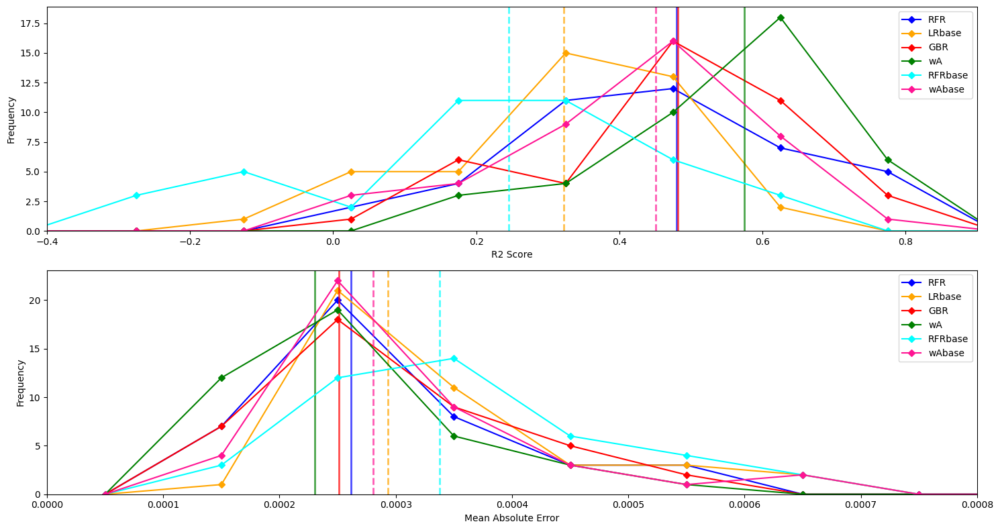

In [139]:
######### make Fig7 
# List of datasets, labels, and colors
datasets = [
    {"data": r2rf, "label": "RFR", "color": "blue", "line_style": "solid"},
    {"data": r2l, "label": "LRbase", "color": "orange", "line_style": "dashed"},
    {"data": r2gb, "label": "GBR", "color": "red", "line_style": "solid"},
    {"data": r2w, "label": "wA", "color": "green", "line_style": "solid"},
    {"data": r2rf2, "label": "RFRbase", "color": "cyan", "line_style": "dashed"},
    {"data": r2w_lr, "label": "wAbase", "color": "deeppink", "line_style": "dashed"},
    
    {"data": r2xgbbase, "label": "XGBbase", "color": "deeppink", "line_style": "dashed"},
    {"data": r2lgbmbase, "label": "LGBMbase", "color": "deeppink", "line_style": "dashed"},
    {"data": r2catbase, "label": "CatBase", "color": "deeppink", "line_style": "dashed"},
    {"data": r2xgb, "label": "XGBbase", "color": "deeppink", "line_style": "solid"},
    {"data": r2lgbm, "label": "LGBMbase", "color": "deeppink", "line_style": "solid"},
    {"data": r2cat, "label": "CatBase", "color": "deeppink", "line_style": "solid"},
    
    
]


# Define bins using the same binning as in your original code
bins_r2 = np.array([-0.5 + i * 0.15 for i in range(51)])  # Binning for R2 
bins_mae = np.array([-0.000 + i * 0.0001 for i in range(25)])  # Binning for MAE 

# Create figure and axes
fig, [ax, ax2] = plt.subplots(2, 1, figsize=(15, 8))

# Helper function to plot histograms and markers
def plot_histograms(ax, bins, value_index, xlabel, ylabel):
    bin_centers = 0.5 * (bins[1:] + bins[:-1])  # Calculate bin centers
    ic=-1
    for dataset in datasets:
        ic+=1
        data_values = [item[value_index] for item in dataset["data"]]
        if ic<6:
            counts, _, patches = ax.hist(data_values, bins=bins, alpha=0.0, color=dataset["color"])
            ax.plot(bin_centers, counts, color=dataset["color"], marker="D", markersize=5, label=dataset["label"])
            
            # Add vertical lines with specified line styles
            ax.axvline(
                np.median(data_values),
                color=dataset["color"],
                linestyle=dataset["line_style"],
                linewidth=2,
                alpha=0.7,
            )
        print(f"{xlabel} median for {dataset['label']}: {round(np.median(data_values), 5)}")
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.legend()
    
# Plot r2 histograms and markers
plot_histograms(ax, bins_r2, value_index=0, xlabel="R2 Score", ylabel="Frequency")
ax.set_xlim([-0.4, 0.9])

# Plot MAE histograms and markers
plot_histograms(ax2, bins_mae, value_index=1, xlabel="Mean Absolute Error", ylabel="Frequency")
ax2.set_xlim([-0.0000, 0.0008])

# Show the plot
plt.tight_layout()
fig.savefig('data_dynamicalnet/r2_MAE_yearv2.png', dpi=300, bbox_inches='tight')    
plt.show()

In [152]:
0.92/0.89-1

0.03370786516853941

In [117]:
# for the sort time period
start, end = '2022-08-31', '2024-07-31'
df_filtered=pd.read_csv('../data_stocks/S&Pcompanies_dic.csv')
values=df_filtered['GICS Sector'].tolist()
keys=df_filtered['Symbol'].tolist()
dic_sector=dict(map(lambda i,j : (i,j) , keys,values))

df=pd.read_csv('../data_stocks_h/df_stocks_'+start+'_'+end+'.csv', index_col=[0], parse_dates=[0])

Time=len(df)
Nstocks=df.columns
labstocks=list(df.columns.values)
dicstocks={}
for i in range(len(labstocks)):
    dicstocks[i]=labstocks[i]
Nstocks=len(df.columns)
print('Time=',Time,'Nstock=',Nstocks)

# for the short time period:
num_lags=12
W=23

Time= 3346 Nstock= 488


In [118]:
# preparing the training dataset
Ntrain=int(0.85*Nstocks)
random.seed(10)
ts=[i for i in range(Nstocks)]
random.shuffle(ts)
dfiall=[]



for istock in ts[:Ntrain]:
    filename = f'data_pdfnetwork_hglob/stock_{istock}_results_h.csv'
    dfi=pd.read_csv(filename)    
    # smooth data mean average of past W values 
    dfi_smoothed=rolling_mean_dataframe(dfi,window=W)
    vart0=list(dfi_smoothed.columns)
    dfsel= dfi_smoothed.copy()
    for lag in range(1, num_lags + 1):
        for var in vart0:
                dfsel[f'{var}_{lag}'] = dfsel[var].shift(lag)
    dfsel.dropna(inplace=True)
    dfsel.reset_index(drop=True, inplace=True)
    dfiall.append(dfsel)
    
# Concatenate all dataframes in the list
combined_df = pd.concat(dfiall, ignore_index=True)
print(len(combined_df))

varlag=['log return_'+str(i) for i in range(1,num_lags+1)]
dfi_smoothed.head()


# baseline ML prediction : select input okin features network from correlations (top 25th quantile pdf) 
dftrain,dic_corr,okin=select_inputdf(combined_df,vart0)
models = make_training_baselinev0article(dftrain, 'log return', vart0,dic_corr,num_lags)

/var/folders/8x/k29py3592yb30gxb21nqnbz40000gn/T/ipykernel_72277/3959333174.py:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  dfsel[f'{var}_{lag}'] = dfsel[var].shift(lag)
/var/folders/8x/k29py3592yb30gxb21nqnbz40000gn/T/ipykernel_72277/3959333174.py:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  dfsel[f'{var}_{lag}'] = dfsel[var].shift(lag)
/var/folders/8x/k29py3592yb30gxb21nqnbz40000gn/T/ipykernel_72277/3959333174.py:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

93564


In [120]:
# to adress the referee comments we also make a standard pipeline with
#1-different models, 
#2-hyperparameter calibration 
#3- and with solely log-retun lag vs features from network
print('*'*50)
target='log return'
print('read or train and tune models for network feats input')
models_new=train_and_tune_models(combined_df,vart0 ,target, test_size=0.2, random_state=42, n_iter=15, model_dir="models_net_h")

print('*'*50)
print('read or train and tune models for lag of log-return feats input')
# make models without network feats only lag return:
vartodrop = [col for col in combined_df.columns if not col.startswith('log return')]
vartodrop.insert(0,target)
models_new_lg_only=train_and_tune_models(combined_df,vartodrop ,target, test_size=0.2, random_state=42, n_iter=15, model_dir="models_logonly_h")


**************************************************
read or train and tune models for network feats input
Loading XGBoost model...
Loading LightGBM model...
Loading CatBoost model...

Model Performance:
XGBoost: RMSE = 0.0001, R² = 0.9147
LightGBM: RMSE = 0.0001, R² = 0.9255
CatBoost: RMSE = 0.0001, R² = 0.9254
**************************************************
read or train and tune models for lag of log-return feats input
Loading XGBoost model...
Loading LightGBM model...
Loading CatBoost model...

Model Performance:
XGBoost: RMSE = 0.0001, R² = 0.8951
LightGBM: RMSE = 0.0001, R² = 0.8967
CatBoost: RMSE = 0.0001, R² = 0.8962


/var/folders/8x/k29py3592yb30gxb21nqnbz40000gn/T/ipykernel_72277/1691553857.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  dfsel[f'{var}_{lag}'] = dfsel[var].shift(lag)
/var/folders/8x/k29py3592yb30gxb21nqnbz40000gn/T/ipykernel_72277/1691553857.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  dfsel[f'{var}_{lag}'] = dfsel[var].shift(lag)
/var/folders/8x/k29py3592yb30gxb21nqnbz40000gn/T/ipykernel_72277/1691553857.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

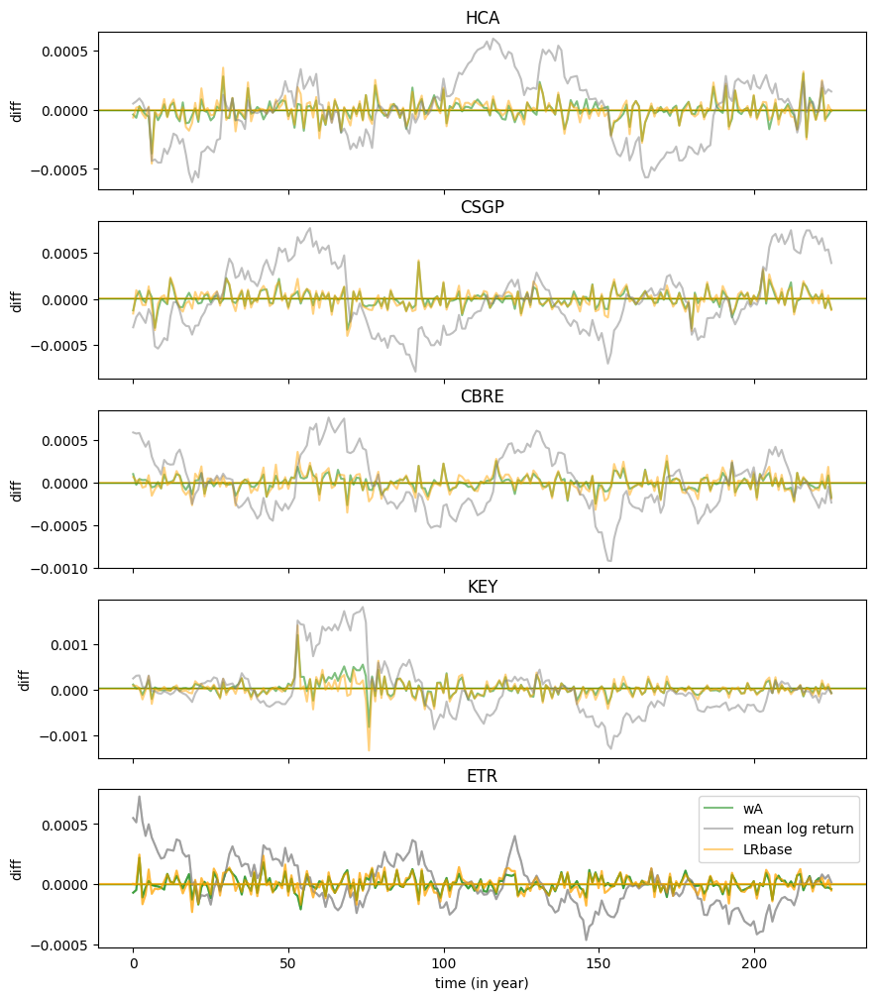

In [127]:
# we predict the models on the test set and output a plot for the pred of 5 stocks 
num_subplots = 5
fig, axes = plt.subplots(num_subplots, 1, sharex=True, figsize=(10, 12))


r2rf=[]
r2rf2=[]
r2gb=[]
r2l=[]
r2w=[]
r2m=[]
r2w_lr=[]
r2xgbbase=[]
r2lgbmbase=[]
r2catbase=[]
r2xgb=[]
r2lgbm=[]
r2cat=[]
colist=makecollist(len(ts[Ntrain:]))
ic=0

# make a prediction for each stock in the test set
for istock in ts[Ntrain:]:
    filename = f'data_pdfnetwork_hglob/stock_{istock}_results_h.csv'
    dfi=pd.read_csv(filename)
    # smooth data mean average of past W values 
    dfi_smoothed=rolling_mean_dataframe(dfi,window=W)

    #################################################################
    # predictions with the network features: ########################
    vart0=list(dfi_smoothed.columns)
    dfsel= dfi_smoothed.copy()
    for lag in range(1, num_lags + 1):
        for var in vart0:
                dfsel[f'{var}_{lag}'] = dfsel[var].shift(lag)
    dfsel.dropna(inplace=True)
    dfsel.reset_index(drop=True, inplace=True)
    dfsel2=dfsel.copy()
    
    dfsel=dfsel[okin]
    y_true=dfsel['log return']
    X_test=dfsel.drop(vart0, axis=1)
    X_test2=dfsel2.drop(vart0, axis=1)
    
    rf_predictions = models['RandomForest'].predict(X_test)
    gb_predictions = models['GradientBoosting'].predict(X_test)
    XGBoost_predictions=models_new['XGBoost'].predict(X_test2)
    LightGBM_predictions=models_new['LightGBM'].predict(X_test2)
    CatBoost_predictions=models_new['CatBoost'].predict(X_test2)

    Ypred=rf_predictions
    mse = mean_absolute_error(y_true,Ypred)
    r2 = r2_score(y_true, Ypred)  
    r2rf.append([r2,mse])

    Ypred=gb_predictions
    mse = mean_absolute_error(y_true,Ypred)
    r2 = r2_score(y_true, Ypred)  
    r2gb.append([r2,mse])


    Ypred=XGBoost_predictions
    mse = mean_absolute_error(y_true,Ypred)
    r2 = r2_score(y_true, Ypred)  
    r2xgb.append([r2,mse])

    Ypred=LightGBM_predictions
    mse = mean_absolute_error(y_true,Ypred)
    r2 = r2_score(y_true, Ypred)  
    r2lgbm.append([r2,mse])

    Ypred=CatBoost_predictions
    mse = mean_absolute_error(y_true,Ypred)
    r2 = r2_score(y_true, Ypred)  
    r2cat.append([r2,mse])
    
     # Calculate the weighted average
    predictions_weights = {
    "RandomForest": {"predictions": models['RandomForest'].predict(X_test), "weight": 0.91},
    "GradientBoosting": {"predictions": models['GradientBoosting'].predict(X_test), "weight": 0.91},
    "XGBoost": {"predictions": models_new['XGBoost'].predict(X_test2), "weight": 0.91},
    "LightGBM": {"predictions": models_new['LightGBM'].predict(X_test2), "weight": 0.93},
    "CatBoost": {"predictions": models_new['CatBoost'].predict(X_test2), "weight": 0.93}}
    numerator = sum(pred["predictions"] * pred["weight"] for pred in predictions_weights.values())
    denominator = sum(pred["weight"] for pred in predictions_weights.values())
    yw = numerator / denominator

    Ypred=yw
    mse = mean_absolute_error(y_true,Ypred)
    r2 = r2_score(y_true, Ypred)  
    r2w.append([r2,mse])

    ###############################################################
    # prediction without network features #########################
    varlagsel=[]
    varlag=[]
    for i in range(1,num_lags+1): 
        varlag.append('log return_'+str(i))
        if 'log return_'+str(i) in dftrain.columns:
            varlagsel.append('log return_'+str(i))
            
    X_testlagsel=X_test[varlagsel]
    X_testlag=X_test2[varlag]
    rf_predictions2 = models['RandomForest2'].predict(X_testlagsel)
    lin_reg_predictions = models['LinearRegression']['slope'] * X_test['log return_1'] + models['LinearRegression']['intercept']
    XGBoost_predictions_lgonly=models_new_lg_only['XGBoost'].predict(X_testlag)
    LightGBM_predictions_lgonly=models_new_lg_only['LightGBM'].predict(X_testlag)
    CatBoost_predictions_lgonly=models_new_lg_only['CatBoost'].predict(X_testlag)
    
    Ypred=rf_predictions2
    mse = mean_absolute_error(y_true,Ypred)
    r2 = r2_score(y_true, Ypred)  
    r2rf2.append([r2,mse])

    Ypred=lin_reg_predictions
    mse = mean_absolute_error(y_true,Ypred)
    r2 = r2_score(y_true, Ypred)  
    r2l.append([r2,mse])

    Ypred=XGBoost_predictions_lgonly
    mse = mean_absolute_error(y_true,Ypred)
    r2 = r2_score(y_true, Ypred)  
    r2xgbbase.append([r2,mse])

    Ypred=LightGBM_predictions_lgonly
    mse = mean_absolute_error(y_true,Ypred)
    r2 = r2_score(y_true, Ypred)  
    r2lgbmbase.append([r2,mse])

    Ypred=CatBoost_predictions_lgonly
    mse = mean_absolute_error(y_true,Ypred)
    r2 = r2_score(y_true, Ypred)  
    r2catbase.append([r2,mse])
    
    predictions_weights_new = {
    "RandomForest2": {"predictions": models['RandomForest2'].predict(X_testlagsel), "weight": 0.88},
    "LinearRegression": {
        "predictions": models['LinearRegression']['slope'] * X_test['log return_1'] + models['LinearRegression']['intercept'],
        "weight": 0.88  # Example weight, adjust as needed
    },
    "XGBoost_lgonly": {"predictions": models_new_lg_only['XGBoost'].predict(X_testlag), "weight": 0.9},
    "LightGBM_lgonly": {"predictions": models_new_lg_only['LightGBM'].predict(X_testlag), "weight": 0.9},
    "CatBoost_lgonly": {"predictions": models_new_lg_only['CatBoost'].predict(X_testlag), "weight": 0.9},}

    # Calculate the weighted average for the lag lr only models
    numerator_new = sum(pred["predictions"] * pred["weight"] for pred in predictions_weights_new.values())
    denominator_new = sum(pred["weight"] for pred in predictions_weights_new.values())
    yw_lr_only = numerator_new / denominator_new

    Ypred=yw_lr_only
    mse = mean_absolute_error(y_true,Ypred)
    r2 = r2_score(y_true, Ypred)  
    r2w_lr.append([r2,mse])


    if (ic<=num_subplots):
        
        if  ic<5:
            ic+=1
            #axes[ic-1].plot((y_true),marker='D',alpha=0.54,lw=0.1,label=dicstocks[istock],color=col)
            axes[ic-1].plot((yw-y_true),alpha=0.5,lw=1.5,color='green')
            axes[ic-1].axhline(y=np.mean((yw-y_true)), color='green',lw=1)
            axes[ic-1].plot((lin_reg_predictions-y_true),alpha=0.5,lw=1.5,color='orange')
            axes[ic-1].axhline(y=np.mean(lin_reg_predictions-y_true),alpha=0.5,lw=1.5,color='orange')
            axes[ic-1].plot((np.mean(y_true)-y_true),alpha=0.5,lw=1.5,color='grey')
           
            
            axes[ic-1].set_title(dicstocks[istock])
            axes[ic-1].set_ylabel('diff')
            if ic==num_subplots:
                axes[ic-1].set_xlabel('time (in year)')
                axes[ic-1].plot((yw-y_true),alpha=0.5,lw=1.5,color='green',label='wA')
                axes[ic-1].plot((np.mean(y_true)-y_true),alpha=0.5,lw=1.5,color='grey',label='mean log return')
                axes[ic-1].plot((lin_reg_predictions-y_true),alpha=0.5,lw=1.5,color='orange',label='LRbase')
                axes[ic-1].axhline(y=np.mean(lin_reg_predictions-y_true),alpha=0.5,lw=1.5,color='orange')
                axes[ic-1].legend()    

R2 Score median for RFR: 0.91506
R2 Score median for LRbase: 0.88734
R2 Score median for GBR: 0.90779
R2 Score median for wA: 0.9182
R2 Score median for RFRbase: 0.88683
R2 Score median for wAbase: 0.88871
R2 Score median for XGBbase: 0.88614
R2 Score median for LGBMbase: 0.88878
R2 Score median for CatBase: 0.88732
R2 Score median for XGB: 0.90943
R2 Score median for LGBM: 0.9208
R2 Score median for Cat: 0.92076
Mean Absolute Error median for RFR: 6e-05
Mean Absolute Error median for LRbase: 7e-05
Mean Absolute Error median for GBR: 7e-05
Mean Absolute Error median for wA: 6e-05
Mean Absolute Error median for RFRbase: 7e-05
Mean Absolute Error median for wAbase: 7e-05
Mean Absolute Error median for XGBbase: 7e-05
Mean Absolute Error median for LGBMbase: 7e-05
Mean Absolute Error median for CatBase: 7e-05
Mean Absolute Error median for XGB: 7e-05
Mean Absolute Error median for LGBM: 6e-05
Mean Absolute Error median for Cat: 6e-05


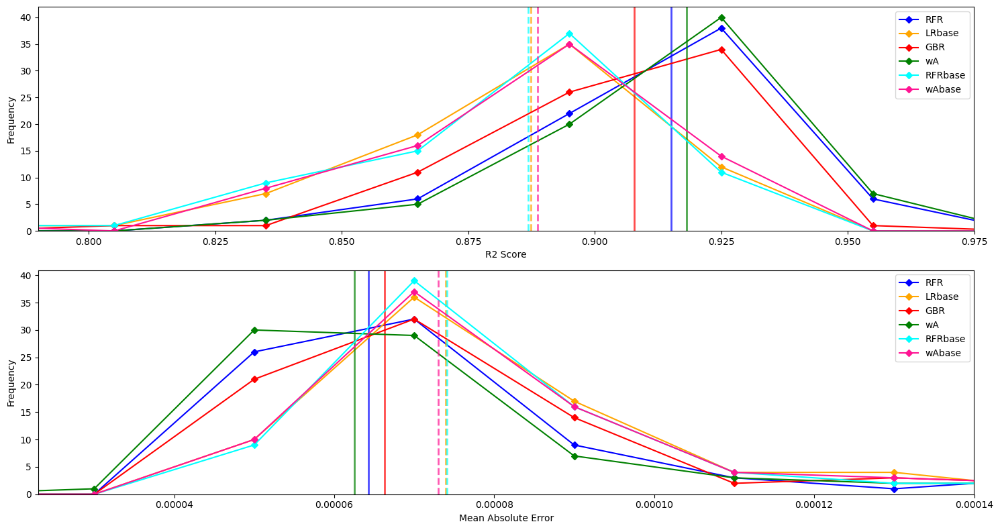

In [132]:
######### make Fig8 
# List of datasets, labels, and colors
datasets = [
    {"data": r2rf, "label": "RFR", "color": "blue", "line_style": "solid"},
    {"data": r2l, "label": "LRbase", "color": "orange", "line_style": "dashed"},
    {"data": r2gb, "label": "GBR", "color": "red", "line_style": "solid"},
    {"data": r2w, "label": "wA", "color": "green", "line_style": "solid"},
    {"data": r2rf2, "label": "RFRbase", "color": "cyan", "line_style": "dashed"},
    {"data": r2w_lr, "label": "wAbase", "color": "deeppink", "line_style": "dashed"},
    {"data": r2xgbbase, "label": "XGBbase", "color": "yellow", "line_style": "dashed"},
    {"data": r2lgbmbase, "label": "LGBMbase", "color": "lightgreen", "line_style": "dashed"},
    {"data": r2catbase, "label": "CatBase", "color": "plum", "line_style": "dashed"},
    {"data": r2xgb, "label": "XGB", "color": "olive", "line_style": "solid"},
    {"data": r2lgbm, "label": "LGBM", "color": "teal", "line_style": "solid"},
    {"data": r2cat, "label": "Cat", "color": "indigo", "line_style": "solid"},
    
    
]
# Define bins using the same binning as in your original code
bins_r2 = np.array([-0.5+i*0.03 for i in range(51)])  # Binning for R2 
bins_mae = np.array([-0.000+i*0.00002 for i in range(25)])  # Binning for MAE 

# Create figure and axes
fig, [ax, ax2] = plt.subplots(2, 1, figsize=(15, 8))

# Helper function to plot histograms and markers
def plot_histograms(ax, bins, value_index, xlabel, ylabel):
    ic=-1
    bin_centers = 0.5 * (bins[1:] + bins[:-1])  # Calculate bin centers
    for dataset in datasets:
        ic+=1
        data_values = [item[value_index] for item in dataset["data"]]
        counts, _, patches = ax.hist(data_values, bins=bins, alpha=0.0, color=dataset["color"])
        if ic<6:
            ax.plot(bin_centers, counts, color=dataset["color"], marker="D", markersize=5, label=dataset["label"])
            
            # Add vertical lines with specified line styles
            ax.axvline(
                np.median(data_values),
                color=dataset["color"],
                linestyle=dataset["line_style"],
                linewidth=2,
                alpha=0.7,
            )
        print(f"{xlabel} median for {dataset['label']}: {round(np.median(data_values), 5)}")
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.legend()
    
# Plot r2 histograms and markers
plot_histograms(ax, bins_r2, value_index=0, xlabel="R2 Score", ylabel="Frequency")
ax.set_xlim([0.79,0.975])

# Plot MAE histograms and markers
plot_histograms(ax2, bins_mae, value_index=1, xlabel="Mean Absolute Error", ylabel="Frequency")
ax2.set_xlim([0.000023,0.00014])

# Show the plot
plt.tight_layout()
fig.savefig('data_dynamicalnet/r2_MAE_hoursv2.png', dpi=300, bbox_inches='tight')    
plt.show()

In [133]:
#improvement average r2 score
(3.18+3.32+2.64+3.61+3.78)/5

3.306

In [158]:
(4*14)/5

11.2